# Hotel cncelation predection 

Step 1: Imprting some libraries for data understand 

In [284]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [285]:
df = pd.read_csv('hotel_bookings.csv')

In [286]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


# Cheking the shape of data (Columns and Rows)

In [287]:
df.shape

(119390, 32)

# Cheking the Null Values & Type of data
Step:2 Treatment of Null Values

In [288]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

# Cheking some statical info for numerical values.

In [289]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


# cheking null values in percentage

In [290]:
round(100*(df.isnull().sum()/len(df.index)),2)

hotel                              0.00
is_canceled                        0.00
lead_time                          0.00
arrival_date_year                  0.00
arrival_date_month                 0.00
arrival_date_week_number           0.00
arrival_date_day_of_month          0.00
stays_in_weekend_nights            0.00
stays_in_week_nights               0.00
adults                             0.00
children                           0.00
babies                             0.00
meal                               0.00
country                            0.41
market_segment                     0.00
distribution_channel               0.00
is_repeated_guest                  0.00
previous_cancellations             0.00
previous_bookings_not_canceled     0.00
reserved_room_type                 0.00
assigned_room_type                 0.00
booking_changes                    0.00
deposit_type                       0.00
agent                             13.69
company                           94.31


Removing some values which are above 45%

In [291]:
df.drop(['company'],axis=1,inplace=True)

##Removing the agent column we see that describe numbers for reservation. so droping the agent column.

In [292]:
df.drop(['agent'],axis=1,inplace=True)

In [293]:
round(100*(df.isnull().sum()/len(df.index)),2)

hotel                             0.00
is_canceled                       0.00
lead_time                         0.00
arrival_date_year                 0.00
arrival_date_month                0.00
arrival_date_week_number          0.00
arrival_date_day_of_month         0.00
stays_in_weekend_nights           0.00
stays_in_week_nights              0.00
adults                            0.00
children                          0.00
babies                            0.00
meal                              0.00
country                           0.41
market_segment                    0.00
distribution_channel              0.00
is_repeated_guest                 0.00
previous_cancellations            0.00
previous_bookings_not_canceled    0.00
reserved_room_type                0.00
assigned_room_type                0.00
booking_changes                   0.00
deposit_type                      0.00
days_in_waiting_list              0.00
customer_type                     0.00
adr                      

lets cheking country and agent they have some null values
## So filling the nan Values with modes which is most frequent values.

In [294]:
df.fillna(df['country'].mode()[0], inplace = True)


In [295]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,C,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,C,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,C,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,A,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,A,0,No Deposit,0,Transient,98.0,0,1,Check-Out,2015-07-03


cheking null values after the treatment

In [296]:
round(100*(df.isnull().sum()/len(df.index)),2)

hotel                             0.0
is_canceled                       0.0
lead_time                         0.0
arrival_date_year                 0.0
arrival_date_month                0.0
arrival_date_week_number          0.0
arrival_date_day_of_month         0.0
stays_in_weekend_nights           0.0
stays_in_week_nights              0.0
adults                            0.0
children                          0.0
babies                            0.0
meal                              0.0
country                           0.0
market_segment                    0.0
distribution_channel              0.0
is_repeated_guest                 0.0
previous_cancellations            0.0
previous_bookings_not_canceled    0.0
reserved_room_type                0.0
assigned_room_type                0.0
booking_changes                   0.0
deposit_type                      0.0
days_in_waiting_list              0.0
customer_type                     0.0
adr                               0.0
required_car

In [297]:
#cheking Nan values
df[df.isna().any(axis=1)]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date


Now the all Nan values are cleaned.

# EDA Analysis
Step:3 Analysis for the columns, working some insights.

<AxesSubplot:xlabel='hotel', ylabel='count'>

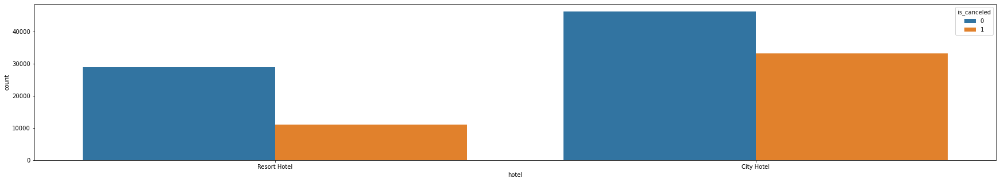

In [298]:
plt.figure(figsize=(30,5))
sns.countplot(df['hotel'], hue=df.is_canceled)

In this analysis the low cancelation rate in the Resort Hotel

<AxesSubplot:xlabel='market_segment', ylabel='count'>

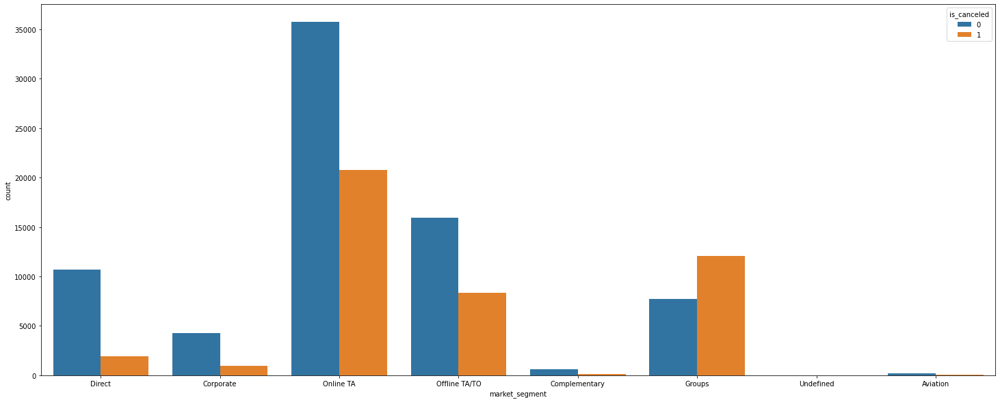

In [299]:
plt.figure(figsize=(25,10))
sns.countplot(df['market_segment'], hue=df.is_canceled)

<AxesSubplot:xlabel='distribution_channel', ylabel='count'>

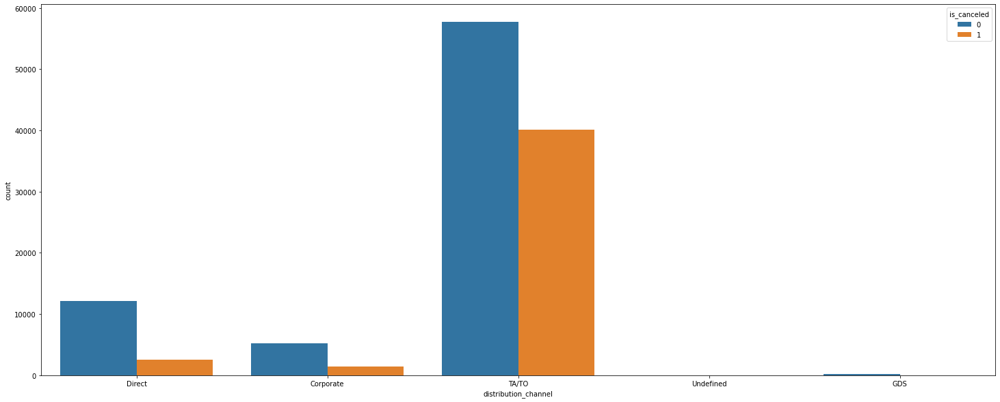

In [300]:
plt.figure(figsize=(25,10))
sns.countplot(df['distribution_channel'], hue=df.is_canceled)

<AxesSubplot:xlabel='deposit_type', ylabel='count'>

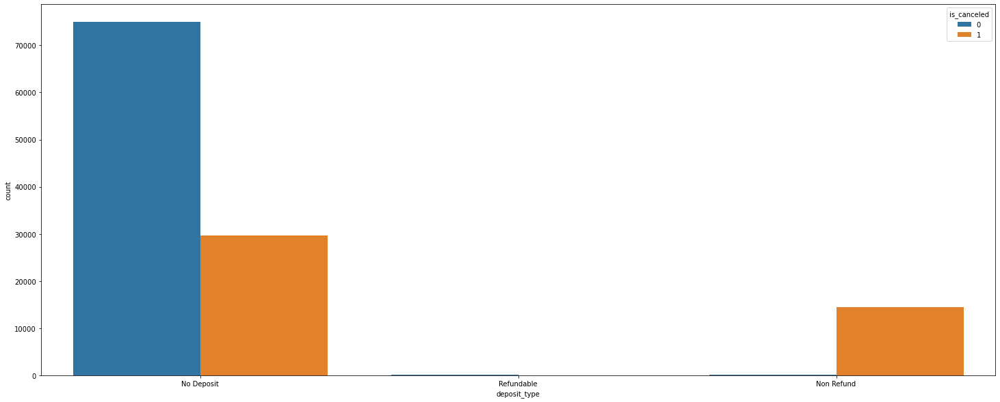

In [301]:
plt.figure(figsize=(25,10))
sns.countplot(df['deposit_type'], hue=df.is_canceled)

<AxesSubplot:xlabel='customer_type', ylabel='count'>

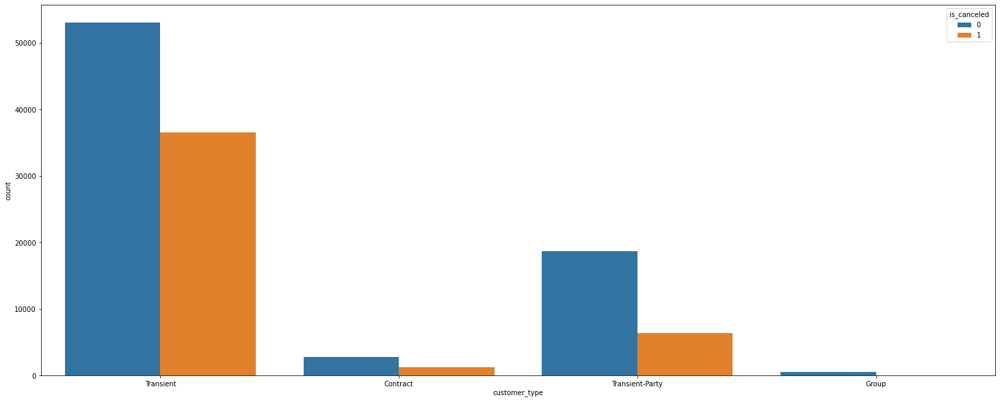

In [302]:
plt.figure(figsize=(25,10))
sns.countplot(df['customer_type'], hue=df.is_canceled)

<AxesSubplot:xlabel='arrival_date_month', ylabel='count'>

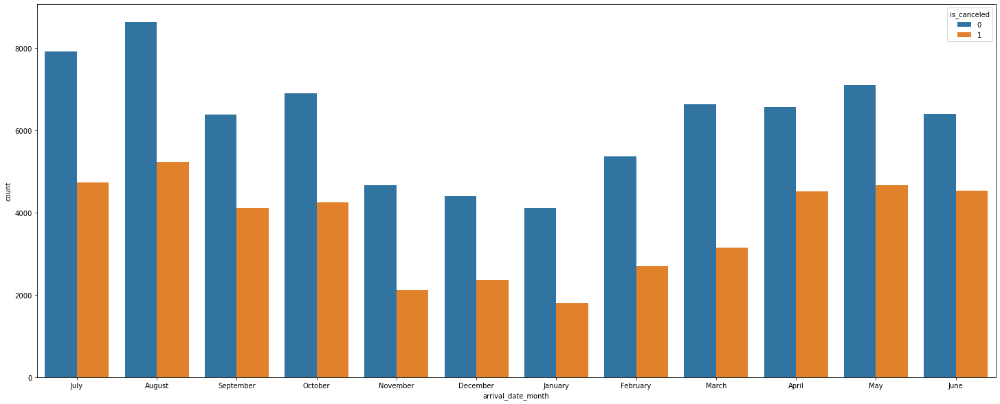

In [303]:
plt.figure(figsize=(25,10))
sns.countplot(df['arrival_date_month'], hue=df.is_canceled)

<AxesSubplot:xlabel='stays_in_weekend_nights', ylabel='count'>

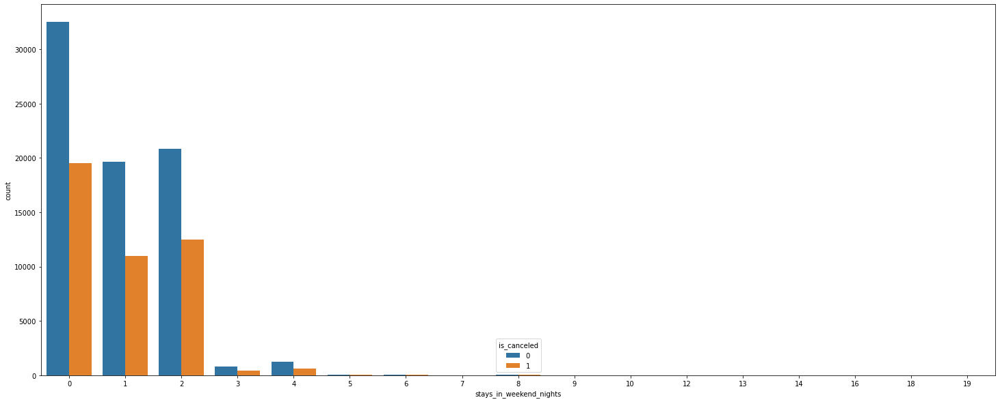

In [304]:
plt.figure(figsize=(25,10))
sns.countplot(df['stays_in_weekend_nights'], hue=df.is_canceled)

<AxesSubplot:xlabel='stays_in_weekend_nights', ylabel='stays_in_week_nights'>

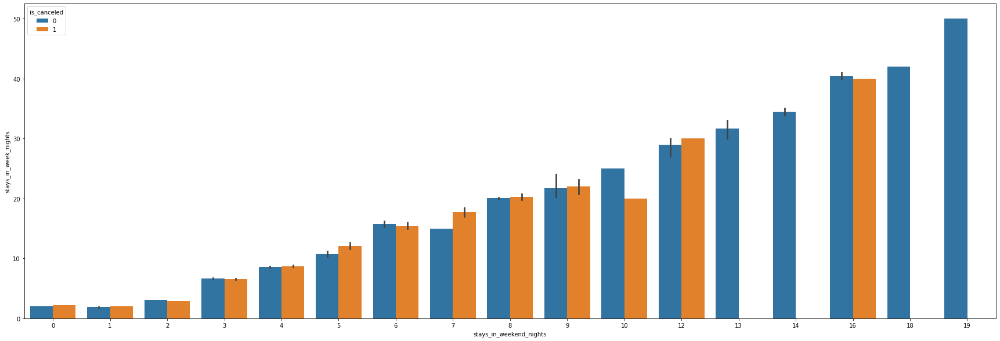

In [305]:
plt.figure(figsize=(30,10))
sns.barplot('stays_in_weekend_nights','stays_in_week_nights',hue=df.is_canceled,data=df)

# Let's check the correlation coefficients to see which variables are highly correlated


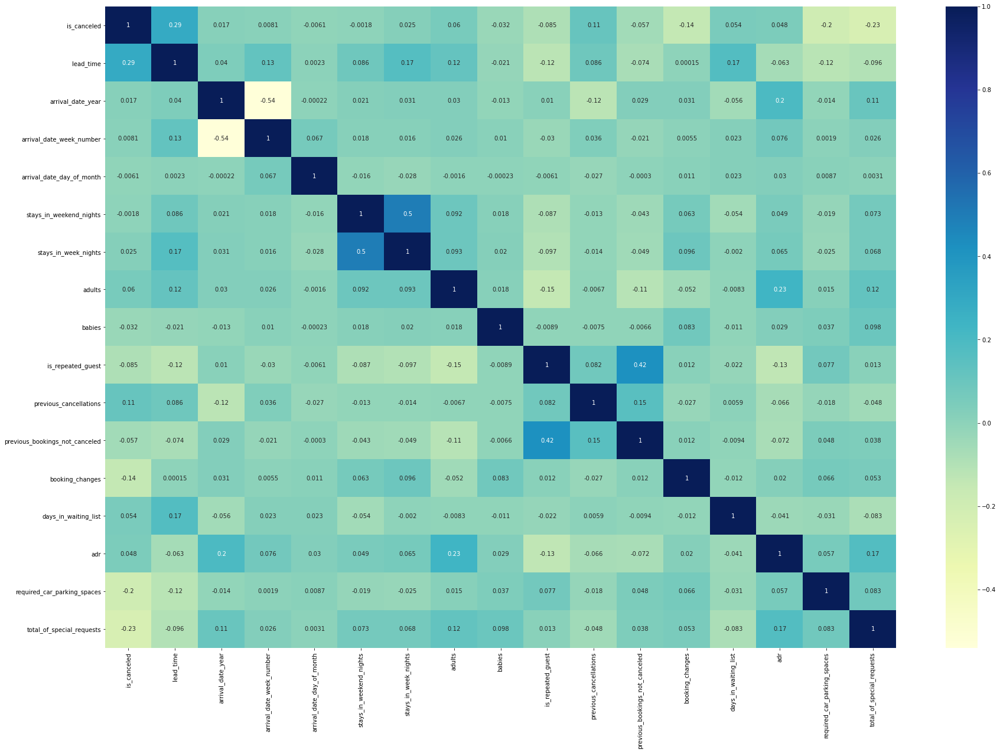

In [306]:
plt.figure(figsize = (30, 20))
sns.heatmap(df.corr(), annot = True, cmap="YlGnBu")
plt.show()

lets droping the two columns which are highly corelated

In [307]:
df.drop(['stays_in_week_nights','previous_bookings_not_canceled'],axis=1,inplace=True)

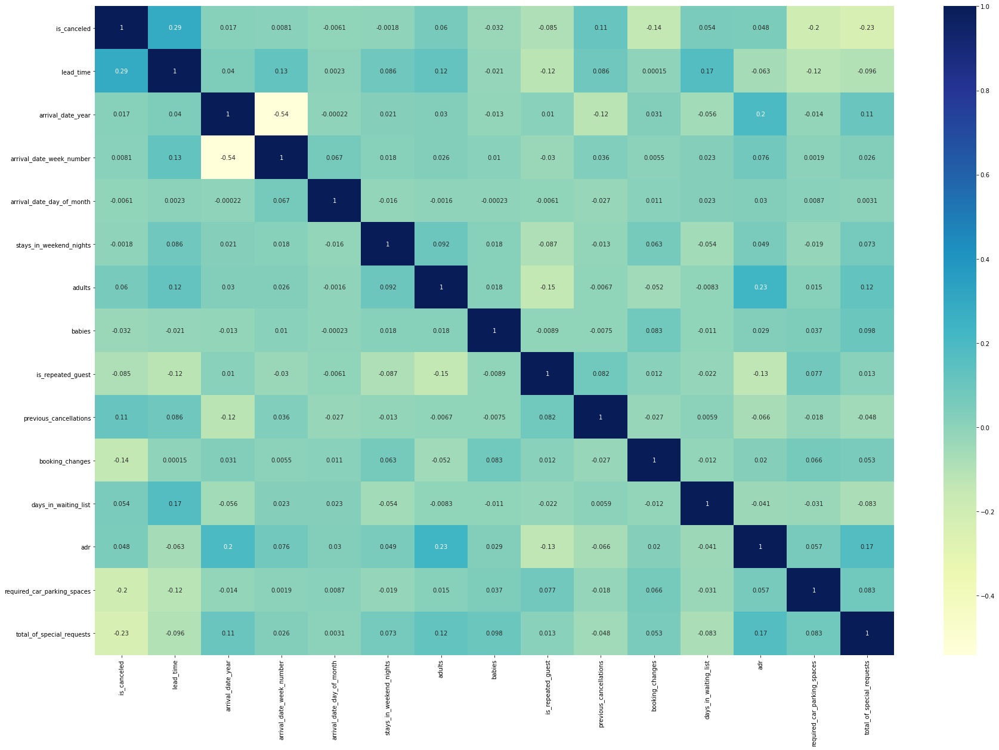

In [308]:
plt.figure(figsize = (30, 20))
sns.heatmap(df.corr(), annot = True, cmap="YlGnBu")
plt.show()

Based on the analysis we have seen that date, year and month columns are not adding any information to the model, hence we can drop them.


In [309]:
df.drop(['arrival_date_year','reservation_status_date','arrival_date_month'],axis=1,inplace=True)

In [310]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 25 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   hotel                        119390 non-null  object 
 1   is_canceled                  119390 non-null  int64  
 2   lead_time                    119390 non-null  int64  
 3   arrival_date_week_number     119390 non-null  int64  
 4   arrival_date_day_of_month    119390 non-null  int64  
 5   stays_in_weekend_nights      119390 non-null  int64  
 6   adults                       119390 non-null  int64  
 7   children                     119390 non-null  object 
 8   babies                       119390 non-null  int64  
 9   meal                         119390 non-null  object 
 10  country                      119390 non-null  object 
 11  market_segment               119390 non-null  object 
 12  distribution_channel         119390 non-null  object 
 13 

we see that the in children column is numeric value but that show as a object, so we need to change in int64

In [311]:
df['children'] = pd.to_numeric(df['children'], errors='coerce')


In [312]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 25 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   hotel                        119390 non-null  object 
 1   is_canceled                  119390 non-null  int64  
 2   lead_time                    119390 non-null  int64  
 3   arrival_date_week_number     119390 non-null  int64  
 4   arrival_date_day_of_month    119390 non-null  int64  
 5   stays_in_weekend_nights      119390 non-null  int64  
 6   adults                       119390 non-null  int64  
 7   children                     119386 non-null  float64
 8   babies                       119390 non-null  int64  
 9   meal                         119390 non-null  object 
 10  country                      119390 non-null  object 
 11  market_segment               119390 non-null  object 
 12  distribution_channel         119390 non-null  object 
 13 

Now change float to int

In [313]:
df['children'].fillna(0, inplace=True)
df['children'] = df['children'].astype(int)


In [314]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 25 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   hotel                        119390 non-null  object 
 1   is_canceled                  119390 non-null  int64  
 2   lead_time                    119390 non-null  int64  
 3   arrival_date_week_number     119390 non-null  int64  
 4   arrival_date_day_of_month    119390 non-null  int64  
 5   stays_in_weekend_nights      119390 non-null  int64  
 6   adults                       119390 non-null  int64  
 7   children                     119390 non-null  int64  
 8   babies                       119390 non-null  int64  
 9   meal                         119390 non-null  object 
 10  country                      119390 non-null  object 
 11  market_segment               119390 non-null  object 
 12  distribution_channel         119390 non-null  object 
 13 

The Children column has been changed into int64, Lets create the dummy column

In [315]:
dummy = pd.get_dummies(df[['hotel', 'meal','country','market_segment','distribution_channel','market_segment','distribution_channel','reserved_room_type','assigned_room_type',
                                    'deposit_type','customer_type','reservation_status']], drop_first=True)

In [316]:
dummy.head()

,hotel_Resort Hotel,meal_FB,meal_HB,meal_SC,meal_Undefined,country_AGO,country_AIA,country_ALB,country_AND,country_ARE,...,assigned_room_type_K,assigned_room_type_L,assigned_room_type_P,deposit_type_Non Refund,deposit_type_Refundable,customer_type_Group,customer_type_Transient,customer_type_Transient-Party,reservation_status_Check-Out,reservation_status_No-Show
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0


In [317]:
df= pd.concat([df, dummy], axis=1)
df.head()

,hotel,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,adults,children,babies,meal,...,assigned_room_type_K,assigned_room_type_L,assigned_room_type_P,deposit_type_Non Refund,deposit_type_Refundable,customer_type_Group,customer_type_Transient,customer_type_Transient-Party,reservation_status_Check-Out,reservation_status_No-Show
0,Resort Hotel,0,342,27,1,0,2,0,0,BB,...,0,0,0,0,0,0,1,0,1,0
1,Resort Hotel,0,737,27,1,0,2,0,0,BB,...,0,0,0,0,0,0,1,0,1,0
2,Resort Hotel,0,7,27,1,0,1,0,0,BB,...,0,0,0,0,0,0,1,0,1,0
3,Resort Hotel,0,13,27,1,0,1,0,0,BB,...,0,0,0,0,0,0,1,0,1,0
4,Resort Hotel,0,14,27,1,0,2,0,0,BB,...,0,0,0,0,0,0,1,0,1,0


Droping the existance one default coumns

In [318]:
df=df.drop(['hotel', 'meal','country','market_segment','distribution_channel','market_segment','distribution_channel','reserved_room_type','assigned_room_type',
                                    'deposit_type','customer_type','reservation_status'],axis=1)

In [319]:
df.shape

(119390, 245)

lets chek the correlation all the new data set after dummy opreation work

In [320]:
plt.figure(figsize = (200, 100))
sns.heatmap(df.corr(), annot = True, cmap="YlGnBu")
plt.show()

Droping the some columns which are highly corelated

In [321]:
df.drop(['market_segment_Complementary','market_segment_Corporate','market_segment_Direct','market_segment_Groups',
        'market_segment_Offline TA/TO','market_segment_Online TA','market_segment_Undefined','distribution_channel_Direct',
        'distribution_channel_GDS','distribution_channel_TA/TO','distribution_channel_Undefined',
        'reserved_room_type_B','reserved_room_type_C','reserved_room_type_D','reserved_room_type_E',
        'reserved_room_type_F','reserved_room_type_G','reserved_room_type_H','reserved_room_type_P',
        'assigned_room_type_B','assigned_room_type_C','assigned_room_type_D','assigned_room_type_E',
        'assigned_room_type_F','assigned_room_type_G','assigned_room_type_H','assigned_room_type_P'],axis=1,inplace=True)

In [322]:
df.shape

(119390, 207)

In [323]:
plt.figure(figsize = (200, 100))
sns.heatmap(df.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [325]:
df.drop(['lead_time','country_PRT','deposit_type_Non Refund','reserved_room_type_L','adr','children'],axis=1,inplace=True)

In [326]:
plt.figure(figsize = (200, 100))
sns.heatmap(df.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [327]:
from sklearn.model_selection import train_test_split
y = df['is_canceled']
X=df.drop('is_canceled', axis=1)

In [328]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [329]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
num_cols=X_train.select_dtypes(include=['float64', 'int64']).columns
X_train[num_cols] = scaler.fit_transform(X_train[num_cols])

In [330]:
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
log = LogisticRegression()

from sklearn.feature_selection import RFE
rfe = RFE(log, 20)             
rfe = rfe.fit(X_train, y_train)

In [331]:
rfe.support_

array([False, False, False, False, False,  True,  True, False, False,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False,  True, False, False, False, False,  True,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [332]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('arrival_date_week_number', False, 24),
 ('arrival_date_day_of_month', False, 59),
 ('stays_in_weekend_nights', False, 22),
 ('adults', False, 3),
 ('babies', False, 68),
 ('is_repeated_guest', True, 1),
 ('previous_cancellations', True, 1),
 ('booking_changes', False, 2),
 ('days_in_waiting_list', False, 16),
 ('required_car_parking_spaces', True, 1),
 ('total_of_special_requests', True, 1),
 ('hotel_Resort Hotel', True, 1),
 ('meal_FB', False, 8),
 ('meal_HB', False, 9),
 ('meal_SC', False, 10),
 ('meal_Undefined', False, 23),
 ('country_AGO', False, 45),
 ('country_AIA', False, 177),
 ('country_ALB', False, 77),
 ('country_AND', False, 97),
 ('country_ARE', False, 41),
 ('country_ARG', False, 28),
 ('country_ARM', False, 95),
 ('country_ASM', False, 172),
 ('country_ATA', False, 119),
 ('country_ATF', False, 122),
 ('country_AUS', False, 20),
 ('country_AUT', True, 1),
 ('country_AZE', False, 145),
 ('country_BDI', False, 180),
 ('country_BEL', True, 1),
 ('country_BEN', False, 88

In [333]:
column = X_train.columns[rfe.support_]
column

Index(['is_repeated_guest', 'previous_cancellations',
       'required_car_parking_spaces', 'total_of_special_requests',
       'hotel_Resort Hotel', 'country_AUT', 'country_BEL', 'country_CHE',
       'country_CN', 'country_DEU', 'country_ESP', 'country_FRA',
       'country_GBR', 'country_IRL', 'country_NLD', 'country_USA',
       'customer_type_Transient', 'customer_type_Transient-Party',
       'reservation_status_Check-Out', 'reservation_status_No-Show'],
      dtype='object')

In [336]:
X_train_rfe = X_train[column]

In [337]:
# Adding a constant variable 
import statsmodels.api as sm  
X_train_rfe = sm.add_constant(X_train_rfe)

In [338]:
# BUILDING MODEL 1
lm = sm.OLS(y_train,X_train_rfe).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            is_canceled   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 6.368e+30
Date:                Fri, 27 Jan 2023   Prob (F-statistic):               0.00
Time:                        01:12:52   Log-Likelihood:             2.5577e+06
No. Observations:               83573   AIC:                        -5.115e+06
Df Residuals:                   83552   BIC:                        -5.115e+06
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                             1.0000   2.33e-16    4.3e+15      0.000       1.000       1.000
is_repeated_guest              1.633e-15   4.38e-17     37.288      0.000    1.55e-15    1.72e-15
previous_cancellations        -4.137e-16   4.34e-17     -9.539      0.000   -4.99e-16   -3.29e-16
required_car_parking_spaces   -4.581e-17    4.5e-17     -1.017      0.309   -1.34e-16    4.24e-17
total_of_special_requests     -2.566e-15   4.52e-17    -56.830      0.000   -2.65e-15   -2.48e-15
hotel_Resort Hotel            -2.355e-15    9.7e-17    -24.288      0.000   -2.55e-15   -2.17e-15
country_AUT                   -7.334e-15   4.29e-16    -17.112      0.000   -8.17e-15   -6.49e-15
country_BEL                   -5.045e-15   3.14e-16    -16.082      0.000   -5.66e-15   -4.43e-15
country_CHE                   -5.058e-15   3.62e-16    -13.956      0.000   -5.77e-15   -4.35e-15
country_CN                    -6.824e-15   4.16e-16    -16.394      0.000   -7.64e-15   -6.01e-15
country_DEU                   -5.198e-15   1.88e-16    -27.715      0.000   -5.57e-15   -4.83e-15
country_ESP                   -7.413e-15   1.73e-16    -42.916      0.000   -7.75e-15   -7.07e-15
country_FRA                   -2.893e-16   1.61e-16     -1.798      0.072   -6.05e-16    2.61e-17
country_GBR                   -6.399e-15   1.52e-16    -42.073      0.000    -6.7e-15    -6.1e-15
country_IRL                   -4.171e-15   2.64e-16    -15.798      0.000   -4.69e-15   -3.65e-15
country_NLD                    -1.36e-14   3.29e-16    -41.297      0.000   -1.42e-14    -1.3e-14
country_USA                    -1.08e-14   3.29e-16    -32.847      0.000   -1.14e-14   -1.02e-14
customer_type_Transient        1.517e-15   2.25e-16      6.748      0.000    1.08e-15    1.96e-15
customer_type_Transient-Party -4.858e-15    2.4e-16    -20.277      0.000   -5.33e-15   -4.39e-15
reservation_status_Check-Out     -1.0000   1.01e-16  -9.89e+15      0.000      -1.000      -1.000
reservation_status_No-Show     -8.83e-16   4.32e-16     -2.044      0.041   -1.73e-15   -3.65e-17
==============================================================================
Omnibus:                    42046.632   Durbin-Watson:                   1.808
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5492.211
Skew:                           0.278   Prob(JB):                         0.00
Kurtosis:                       1.874   Cond. No.                         15.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [339]:
X_train1= X_train_rfe.drop('country_FRA',1)


In [341]:
X_train2= sm.add_constant(X_train1)
lm1 = sm.OLS(y_train,X_train2).fit() 
lm1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            is_canceled   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 4.089e+30
Date:                Fri, 27 Jan 2023   Prob (F-statistic):               0.00
Time:                        10:50:44   Log-Likelihood:             2.5371e+06
No. Observations:               83573   AIC:                        -5.074e+06
Df Residuals:                   83553   BIC:                        -5.074e+06
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                             1.0000   2.98e-16   3.36e+15      0.000       1.000       1.000
is_repeated_guest              1.192e-15   5.59e-17     21.335      0.000    1.08e-15     1.3e-15
previous_cancellations         9.537e-16   5.55e-17     17.174      0.000    8.45e-16    1.06e-15
required_car_parking_spaces   -2.492e-15   5.76e-17    -43.227      0.000    -2.6e-15   -2.38e-15
total_of_special_requests      -2.73e-15   5.77e-17    -47.271      0.000   -2.84e-15   -2.62e-15
hotel_Resort Hotel             1.262e-16   1.23e-16      1.023      0.306   -1.16e-16    3.68e-16
country_AUT                    3.043e-15   5.47e-16      5.557      0.000    1.97e-15    4.12e-15
country_BEL                    1.307e-15      4e-16      3.270      0.001    5.24e-16    2.09e-15
country_CHE                    1.171e-16   4.63e-16      0.253      0.800   -7.89e-16    1.02e-15
country_CN                    -1.499e-15   5.32e-16     -2.818      0.005   -2.54e-15   -4.56e-16
country_DEU                   -8.535e-16   2.37e-16     -3.600      0.000   -1.32e-15   -3.89e-16
country_ESP                    5.395e-16   2.19e-16      2.466      0.014    1.11e-16    9.68e-16
country_GBR                    2.572e-15   1.92e-16     13.386      0.000     2.2e-15    2.95e-15
country_IRL                   -1.376e-15   3.37e-16     -4.088      0.000   -2.04e-15   -7.16e-16
country_NLD                    1.272e-15    4.2e-16      3.029      0.002    4.49e-16     2.1e-15
country_USA                     -2.7e-15   4.19e-16     -6.441      0.000   -3.52e-15   -1.88e-15
customer_type_Transient       -2.147e-15   2.88e-16     -7.459      0.000   -2.71e-15   -1.58e-15
customer_type_Transient-Party -3.929e-15   3.07e-16    -12.808      0.000   -4.53e-15   -3.33e-15
reservation_status_Check-Out     -1.0000   1.27e-16  -7.87e+15      0.000      -1.000      -1.000
reservation_status_No-Show     1.828e-15   5.53e-16      3.307      0.001    7.45e-16    2.91e-15
==============================================================================
Omnibus:                    12863.840   Durbin-Watson:                   0.405
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3124.392
Skew:                           0.113   Prob(JB):                         0.00
Kurtosis:                       2.080   Cond. No.                         15.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [342]:
X_train2= X_train_rfe.drop('hotel_Resort Hotel',1)

In [343]:
X_train3= sm.add_constant(X_train2)
lm1 = sm.OLS(y_train,X_train3).fit() 
lm1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            is_canceled   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.765e+31
Date:                Fri, 27 Jan 2023   Prob (F-statistic):               0.00
Time:                        10:52:45   Log-Likelihood:             2.5982e+06
No. Observations:               83573   AIC:                        -5.196e+06
Df Residuals:                   83553   BIC:                        -5.196e+06
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                             1.0000   1.42e-16   7.03e+15      0.000       1.000       1.000
is_repeated_guest              4.406e-16    2.7e-17     16.330      0.000    3.88e-16    4.94e-16
previous_cancellations         1.584e-15   2.67e-17     59.277      0.000    1.53e-15    1.64e-15
required_car_parking_spaces   -2.992e-15   2.72e-17   -109.971      0.000   -3.05e-15   -2.94e-15
total_of_special_requests     -2.634e-15   2.78e-17    -94.654      0.000   -2.69e-15   -2.58e-15
country_AUT                   -1.685e-14   2.64e-16    -63.843      0.000   -1.74e-14   -1.63e-14
country_BEL                   -5.057e-15   1.93e-16    -26.189      0.000   -5.44e-15   -4.68e-15
country_CHE                   -4.279e-15   2.23e-16    -19.166      0.000   -4.72e-15   -3.84e-15
country_CN                    -1.295e-14   2.56e-16    -50.519      0.000   -1.34e-14   -1.24e-14
country_DEU                   -6.022e-15   1.15e-16    -52.315      0.000   -6.25e-15    -5.8e-15
country_ESP                   -4.466e-15   1.06e-16    -42.016      0.000   -4.67e-15   -4.26e-15
country_FRA                   -5.053e-15   9.85e-17    -51.306      0.000   -5.25e-15   -4.86e-15
country_GBR                   -5.603e-15   9.29e-17    -60.346      0.000   -5.79e-15   -5.42e-15
country_IRL                   -3.195e-15   1.62e-16    -19.767      0.000   -3.51e-15   -2.88e-15
country_NLD                    -7.47e-15   2.03e-16    -36.820      0.000   -7.87e-15   -7.07e-15
country_USA                   -5.716e-15   2.02e-16    -28.239      0.000   -6.11e-15   -5.32e-15
customer_type_Transient       -3.646e-15   1.39e-16    -26.319      0.000   -3.92e-15   -3.37e-15
customer_type_Transient-Party -5.482e-15   1.48e-16    -37.143      0.000   -5.77e-15   -5.19e-15
reservation_status_Check-Out     -1.0000    6.2e-17  -1.61e+16      0.000      -1.000      -1.000
reservation_status_No-Show     -2.04e-15   2.66e-16     -7.665      0.000   -2.56e-15   -1.52e-15
==============================================================================
Omnibus:                     7598.840   Durbin-Watson:                   1.368
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            53426.910
Skew:                           0.087   Prob(JB):                         0.00
Kurtosis:                       6.913   Cond. No.                         14.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [344]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [347]:
X_train_new1 = X_train_rfe.drop(["const"], axis = 1)

In [348]:
vif = pd.DataFrame()
X = X_train_new1
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
18,reservation_status_Check-Out,3.33
16,customer_type_Transient,2.64
17,customer_type_Transient-Party,1.72
4,hotel_Resort Hotel,1.69
12,country_GBR,1.26
11,country_FRA,1.23
10,country_ESP,1.17
9,country_DEU,1.16
3,total_of_special_requests,1.11
2,required_car_parking_spaces,1.10


In [352]:
# Getting the Predicted values on the train set
y_train_pred = lm.predict(X_train_sm)
y_train_pred[:10]

53423     1.000000e+00
76202     5.329071e-15
70775     1.000000e+00
6135     -3.441691e-15
74402     1.000000e+00
115999    3.330669e-15
7270      1.000000e+00
98052     2.109424e-15
108196    6.772360e-15
99161     6.550316e-15
dtype: float64

In [353]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([ 1.00000000e+00,  5.32907052e-15,  1.00000000e+00, -3.44169138e-15,
        1.00000000e+00,  3.33066907e-15,  1.00000000e+00,  2.10942375e-15,
        6.77236045e-15,  6.55031585e-15])

In [354]:
y_train_pred_final = pd.DataFrame({'is_canceled':y_train.values, 'is_canceled_prob':y_train_pred})
y_train_pred_final['P ID'] = y_train.index
y_train_pred_final.head()

,is_canceled,is_canceled_prob,P ID
0,1,1.000000e+00,53423
1,0,5.329071e-15,76202
2,1,1.000000e+00,70775
3,0,-3.441691e-15,6135
4,1,1.000000e+00,74402


In [357]:
y_train_pred_final['Predicted'] = y_train_pred_final.is_canceled_prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,is_canceled,is_canceled_prob,P ID,Predicted
0,1,1.000000e+00,53423,1
1,0,5.329071e-15,76202,0
2,1,1.000000e+00,70775,1
3,0,-3.441691e-15,6135,0
4,1,1.000000e+00,74402,1


In [359]:
from sklearn import metrics


# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.is_canceled, y_train_pred_final.is_canceled)
print(confusion)

[[52642     0]
 [    0 30931]]


In [361]:
print(metrics.accuracy_score(y_train_pred_final.is_canceled, y_train_pred_final.Predicted))


1.0


In [362]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

sensitivity = TP/float(TP+FN)
specificity = TN/float(TN+FP)
FPR = FP/float(TN+FP) 
PPV = TP/float(TP+FP)
NPV = TN/float(TN+FN)

print(f'sensitivity: {sensitivity}\nspecificity: {specificity}\nfalse +ve rate: {FPR}\n+ve predictive value: {PPV}\n-ve predictive value: {NPV}')

sensitivity: 1.0
specificity: 1.0
false +ve rate: 0.0
+ve predictive value: 1.0
-ve predictive value: 1.0


In [363]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

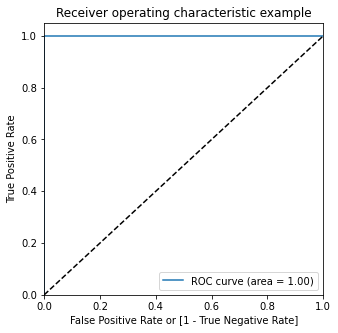

In [366]:
draw_roc(y_train_pred_final.is_canceled, y_train_pred_final.is_canceled_prob)